# Single Cell

# Setup

Data are from Bluebell: `/mnt/data1/chris/projects/ileal-cd/analysis/cellranger/cr_count_2021-09-24` (CD-1, CD-2, CD-3, CD-4, where CD-1 & -2 are inflamed & uninflamed samples, respectively, from record_id FC_Hu_IL2, and CD-3 & -4 are inflamed & un-inflamed samples from FC_Hu_IL3). 

I stored the filtered matrices under four directories named with the convention "/home/asline01/projects/data/ileal-cd/CD-#/filtered_feature_bc_matrix" (where # is 1-4). For example, `/mnt/data1/chris/projects/ileal-cd/analysis/cellranger/cr_count_2021-09-24/outs/filtered_feature_bc_matrix` on Bluebell is stored locally in `/home/asline01/projects/data/ileal-cd/CD-1/filtered_feature_bc_matrix`.

Change the variable `ddd` below to your directory. If you download more subjects/samples, store using the same convention described above, and change the variable `subs` below so that the code includes those directories.

In [81]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import re
import matplotlib.pyplot as plt
import seaborn as sb
import scanpy as sc
import pandas as pd
import corescpy as cr
from corescpy import Omics

sc.set_figure_params(dpi=80, dpi_save=150, frameon=False,
                     vector_friendly=True, fontsize=14, figsize=(20, 20))
plt.figure(figsize=(15, 15))

dir_proj = "/mnt/cho_lab/disk2/elizabeth/projects/psc-ibd"
dir_cr_run = "cr_count_multi_2024-03-07_2300/cr-count-multi_2024-03-07"
libid = "HC_1"
file_path = os.path.join(dir_proj, "analysis/cellranger",
                         dir_cr_run, "outs/per_sample_outs", libid,
                         "count/sample_filtered_feature_bc_matrix")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Single-Cell Object Initialization

In [55]:
self = Omics(file_path)



<<< INITIALIZING OMICS CLASS OBJECT >>>





col_gene_symbols="gene_symbols"
col_cell_type="leiden"
col_sample_id=None
col_batch=None
col_subject=None
col_condition=None
col_num_umis=None








key_control=None
key_treatment=None
key_table=None






<<< LOADING 10X FILE /mnt/cho_lab/disk2/elizabeth/projects/psc-ibd/analysis/cellranger/cr_count_multi_2024-03-07_2300/cr-count-multi_2024-03-07/outs/per_sample_outs/HC_1/count/sample_filtered_feature_bc_matrix >>>


Counts: Initial


	Observations: 1041

	Genes: 18082







 AnnData object with n_obs × n_vars = 1041 × 18082
    var: 'gene_ids', 'feature_types'
    layers: 'counts' 

                      gene_ids    feature_types
gene_symbols                                  
SAMD11        ENSG00000187634  Gene Expression
NOC2L         ENSG00000188976  Gene Expression
KLHL17        ENSG00000187961  Gene Expression
PLEKHN1       ENSG00000187583  Gene Expression
PERM1         ENSG00000187642  Gene Expression 

 Empty DataFrame
Columns: 

# Proprocessing/Clustering Parameters

You can preview QC variables by running `_ = cr.pp.perform_qc(self.rna)`

See numerical details with the following code:

```python
print(f"{'=' * 80}\nGenes:\n{'=' * 80}\n{self.rna.var.describe().round(2)}\n"
      f"{'=' * 80}\nCells:\n{'=' * 80}\n{self.rna.obs.describe().round(2)}\n")
```

## QC Preview


	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




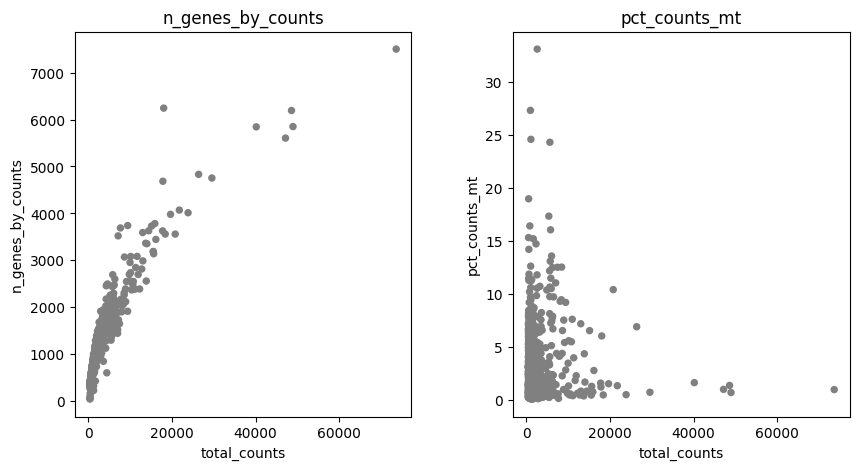

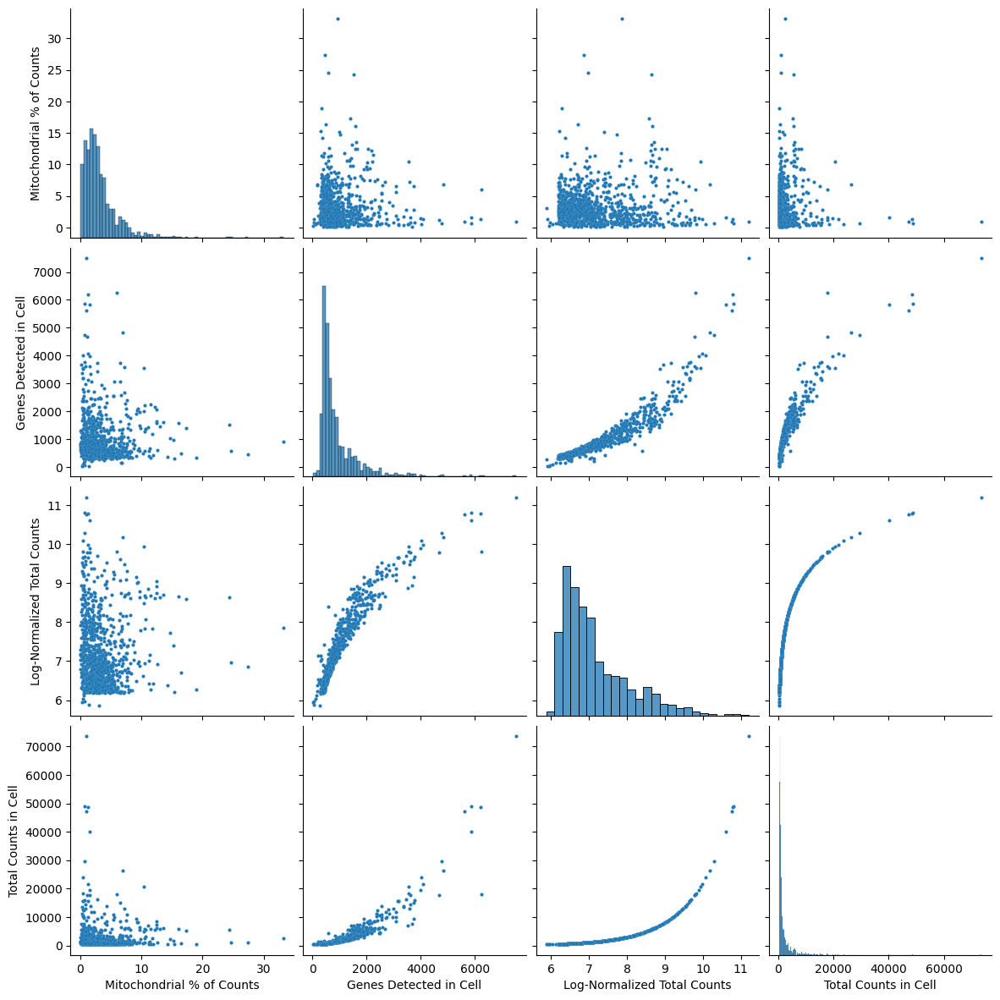

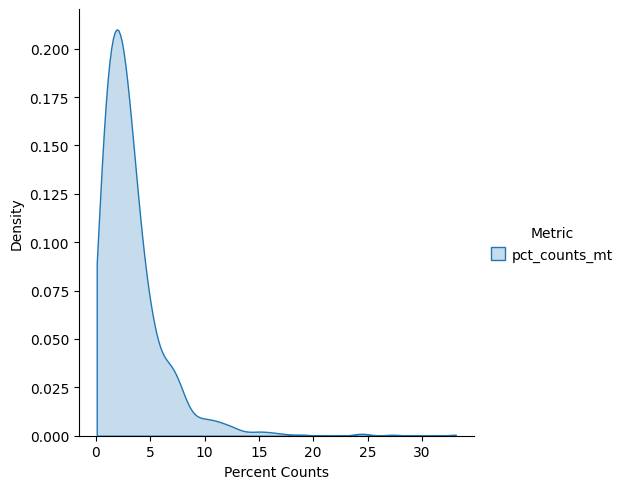

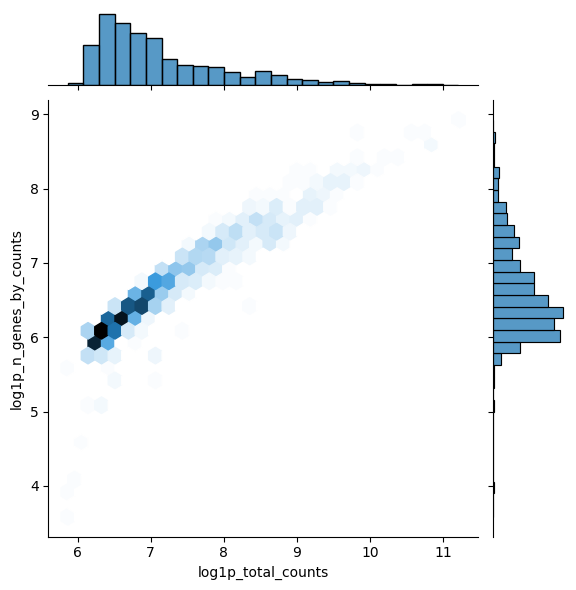

In [56]:
_ = cr.pp.perform_qc(self.rna)

## Set Parameters

In [25]:
outlier_mads = {
    "n_genes_by_counts": [5, None], "pct_counts_mt": [None, 3],
    "pct_counts_ribo": [None, 5], "pct_counts_hb": [None, 5],
    "total_counts": [5, None],  # will filter both genes & cells
    "log1p_total_counts": [5, None], "log1p_n_genes_by_counts": [5, None]
}
# outlier_mads = None  # alternatively
kws_pp = {"regress_out": None, "kws_scale": "log",
          # "cell_filter_ngene": [3, None],
          # "cell_filter_pmt": [0, 10],
          # "cell_filter_ncounts": [3, None], "gene_filter_ncell": [3, None],
          # "gene_filter_ncounts": [],
          "outlier_mads": outlier_mads}

# Preprocess

AnnData object with n_obs × n_vars = 1041 × 18082
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_obs_raw'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Un-Used Keyword Arguments: {'assay_protein': None, 'col_sample_id': None, 'col_batch': None, 'col_subject': None, 'col_condition': None, 'col_num_umis': None}




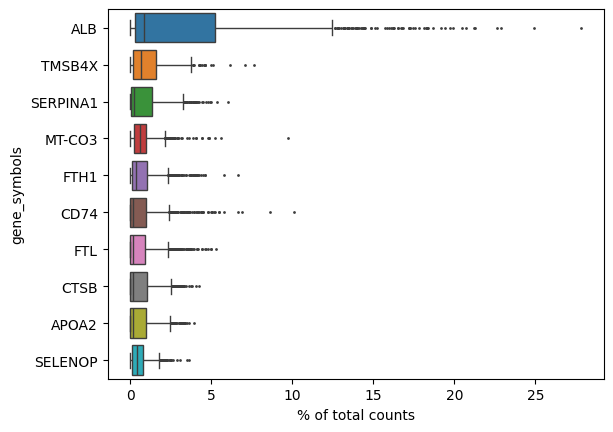



Counts: Initial


	Observations: 1041

	Genes: 18082

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                2.0     0.001921           0.001919              92.795389   
50%               25.0     0.027858           0.027477              97.598463   
75%               75.0     0.088377           0.084687              99.807877   

     total_counts  log1p_total_counts  
25%           2.0            1.098612  
50%          29.0            3.401197  
75%          92.0            4.532599  




<<< PERFORMING QUALITY CONTROL ANALYSIS>>>

	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




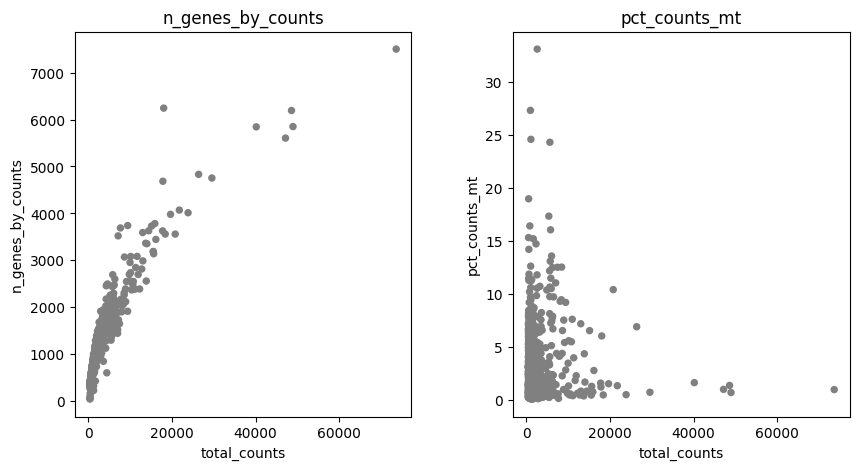


<<< FILTERING CELLS (TOO FEW GENES) & GENES (TOO FEW CELLS) >>>


Counts: Post-`min_gene`


	Observations: 1041

	Genes: 18082

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                2.0     0.001921           0.001919              92.795389   
50%               25.0     0.027858           0.027477              97.598463   
75%               75.0     0.088377           0.084687              99.807877   

     total_counts  log1p_total_counts  
25%           2.0            1.098612  
50%          29.0            3.401197  
75%          92.0            4.532599  





Counts: Post-`min_cell`


	Observations: 1041

	Genes: 18082

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                2.0     0.001921           0.001919              92.795389   
50%               25.0     0.027858           0.027477              97.598463   
75%               75.0     0.088377           0.084687              99.80787

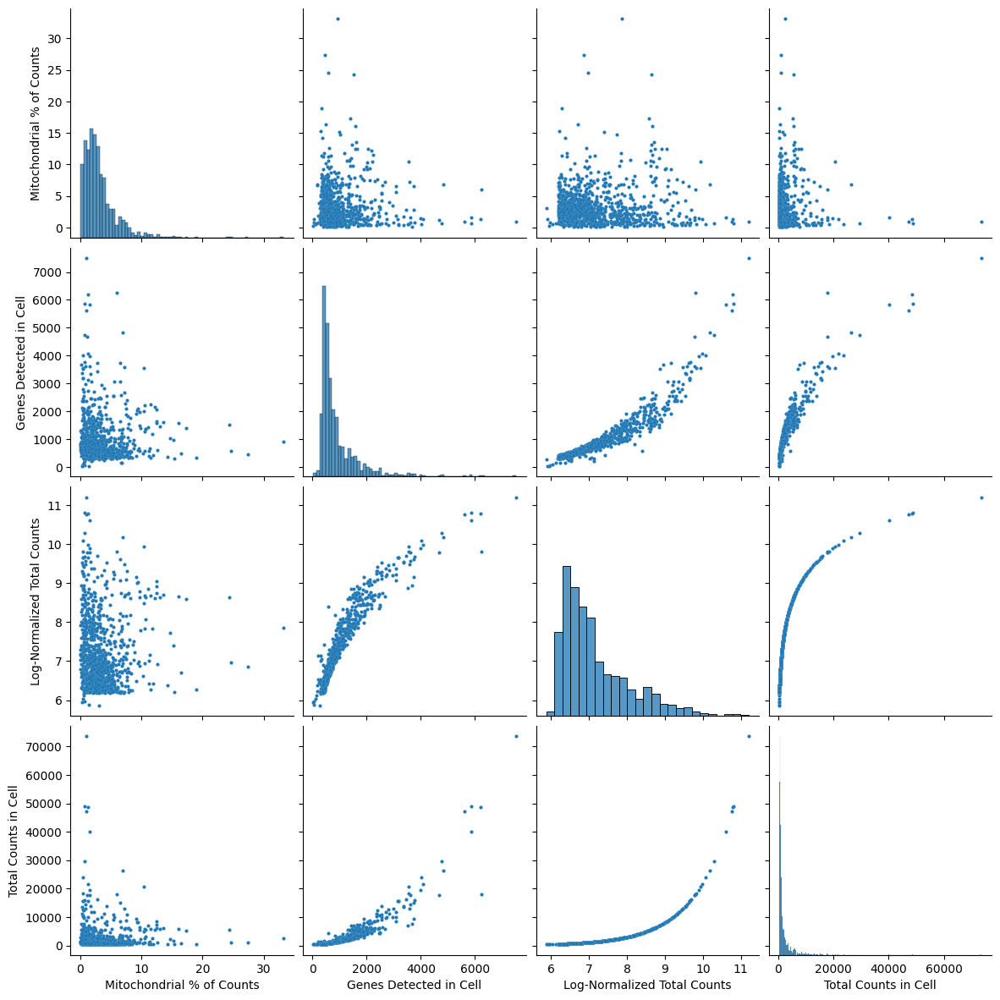

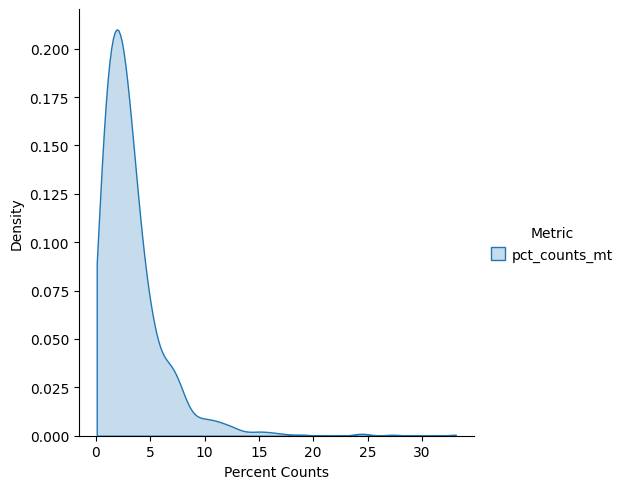

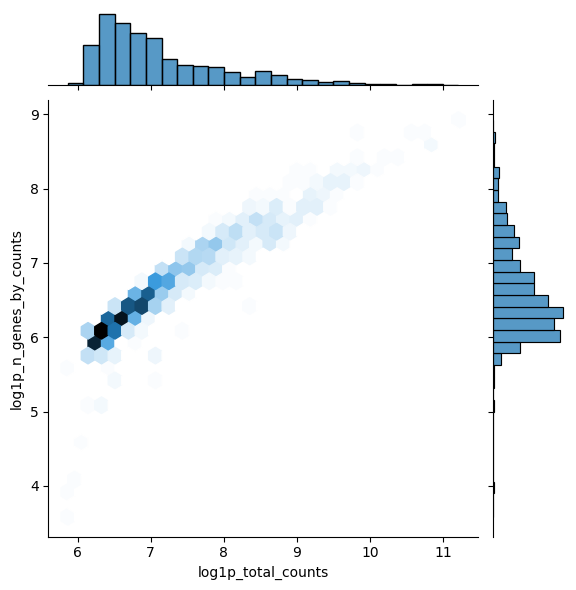

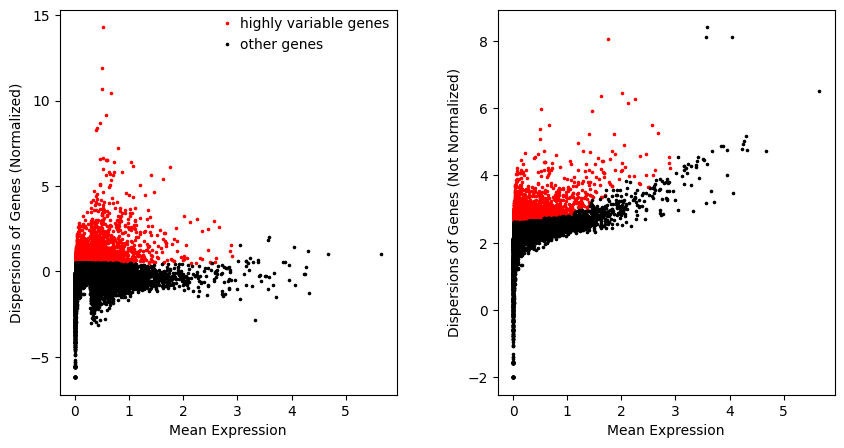


<<< NORMALIZING RAW GENE EXPRESSION >>>

	*** Scaling gene expression...

	*** Scaling => `.X` & scaled layer...


Counts: Post-Processing


	Observations: 915

	Genes: 18082

     log1p_mean_counts  mean_counts  n_cells_by_counts  pct_dropout_by_counts  \
25%           0.001919     0.001921                2.0              92.795389   
50%           0.027477     0.027858               25.0              97.598463   
75%           0.084687     0.088377               75.0              99.807877   

     total_counts  log1p_total_counts     means  dispersions  \
25%           2.0            1.098612  0.009758     2.329369   
50%          29.0            3.401197  0.150632     2.483464   
75%          92.0            4.532599  0.412872     2.629697   

     dispersions_norm      mean       std  
25%         -0.374585  0.002822  0.252376  
50%          0.086998  0.041299  0.463123  
75%          0.429642  0.125991  0.859587  





In [57]:
_, figs = self.preprocess(**kws_pp)

# Clustering

## Set Parameters

In [58]:
resolution = 0.75
min_dist = 0.3
n_comps = 30
use_highly_variable = True

col_leiden = str(f"leiden_res{re.sub('[.]', 'pt', str(resolution))}_dist"
                 f"{re.sub('[.]', 'pt', str(min_dist))}_npc{str(n_comps)}")
self._columns["col_cell_type"] = col_leiden

## Run



Un-used Keyword Arguments: {'assay': None}


<<< PERFORMING PCA >>>
{'use_highly_variable': True, 'n_comps': 30, 'random_state': 0}



<<< COMPUTING NEIGHBORHOOD GRAPH >>>
{'random_state': 0, 'n_pcs': 30}



<<< EMBEDDING UMAP >>>
{'random_state': 0, 'min_dist': 0.3}



<<< CLUSTERING WITH LEIDEN METHOD >>>
Resolution=0.75


<<< CREATING PLOTS >>>


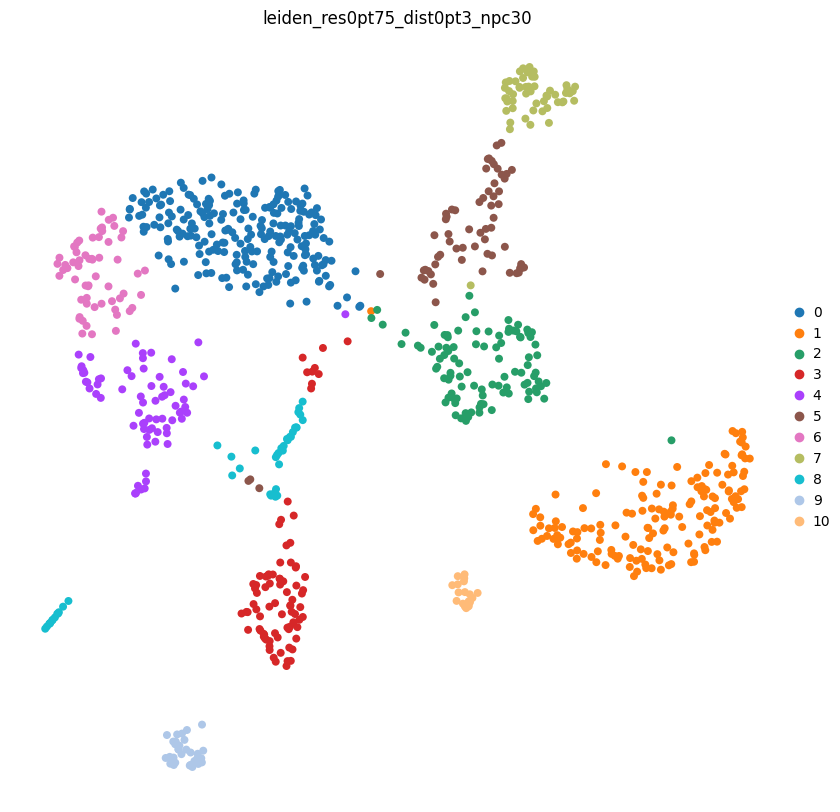

In [59]:
_ = self.cluster(resolution=resolution, n_comps=n_comps,
                 kws_pca={"use_highly_variable": use_highly_variable},
                 kws_umap={"min_dist": min_dist},
                 key_added=col_leiden)
self.plot_umap()

# Find Markers/DEGs

                                         scores  logfoldchanges         pvals  \
leiden_res0pt75_dist0pt3_npc30 names                                            
0                              FTL    21.001562        4.796003  6.346339e-98   
                               C1QA   20.364098        6.133484  3.482018e-92   
                               CD5L   20.177435        6.769950  1.545600e-90   

                                         pvals_adj  n_cells  \
leiden_res0pt75_dist0pt3_npc30 names                          
0                              FTL    1.147545e-93      227   
                               C1QA   3.148092e-88      227   
                               CD5L   9.315843e-87      227   

                                      cells_gene_pos_percent  
leiden_res0pt75_dist0pt3_npc30 names                          
0                              FTL                100.000000  
                               C1QA                98.237885  
                          

scores  logfoldchanges  \
leiden_res0pt75_dist0pt3_npc30 names                               
0                              FTL     21.001562        4.796003   
                               C1QA    20.364098        6.133484   
                               CD5L    20.177435        6.769950   
                               CTSB    20.031464        4.426522   
                               C1QB    19.956451        6.008922   
...                                          ...             ...   
10                             CD74    -3.762457       -3.194148   
                               B2M     -3.798388       -1.879340   
                               LAPTM5  -3.930990       -6.945769   
                               APOE    -4.235973       -4.305055   
                               SRGN    -4.388678       -4.484509   

                                              pvals     pvals_adj  n_cells  \
leiden_res0pt75_dist0pt3_npc30 names                                         
0                              FTL     6.346339e-98  1.147545e-93      227   
                               C1QA    3.482018e-92  3.148092e-88      227   
                               CD5L    1.545600e-90  9.315843e-87      227   
                               CTSB    2.929162e-89  1.324128e-85      227   
                               C1QB    1.317410e-88  4.764282e-85      227   
...                                             ...           ...      ...   
10                             CD74    1.682519e-04  6.914390e-02       20   
                               B2M     1.456401e-04  6.583662e-02       20   
                               LAPTM5  8.459696e-05  4.134276e-02       20   
                               APOE    2.275644e-05  1.645928e-02       20   
                               SRGN    1.140417e-05  9.373189e-03       20   

                                       cells_gene_pos_percent  
leiden_res0pt75_dist0pt3_npc30 names                           
0                              FTL                 100.000000  
                               C1QA                 98.237885  
                               CD5L                 97.797357  
                               CTSB                 99.118943  
                               C1QB                 97.356828  
...                                                       ...  
10                             CD74                 35.000000  
                               B2M                  65.000000  
                               LAPTM5                5.000000  
                               APOE                 15.000000  
                               SRGN                 20.000000  

[198902 rows x 6 columns]

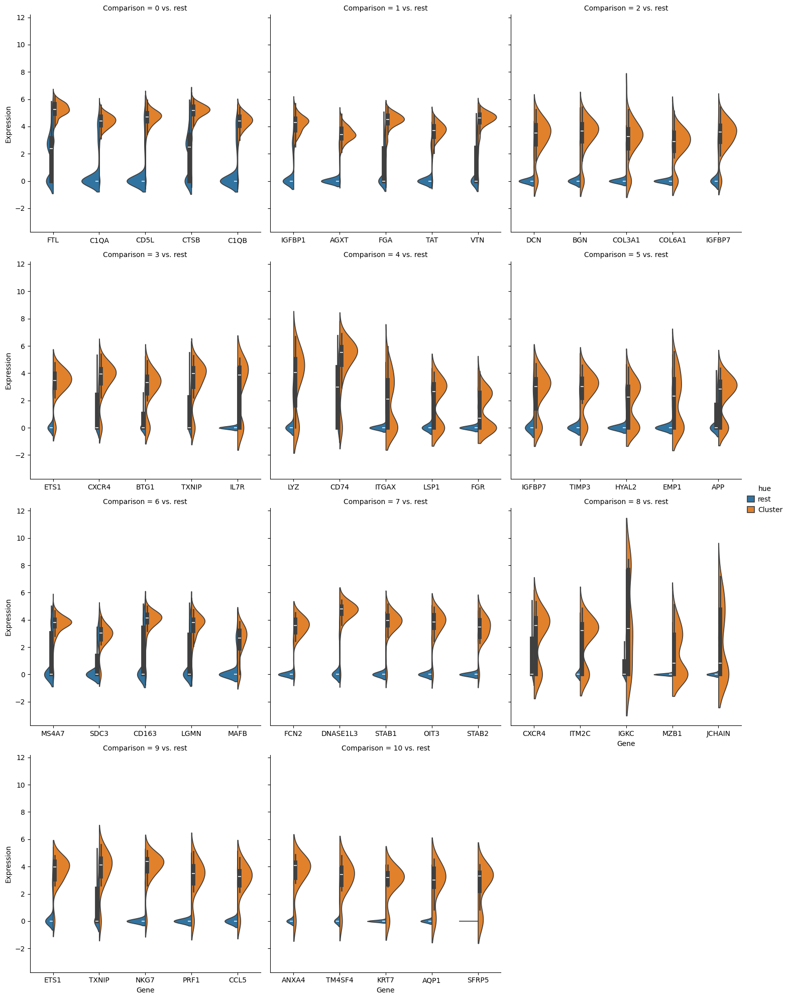

In [60]:
marks, figs_deg = self.find_markers(n_genes=20, col_cell_type=col_leiden)
marks

# Annotations

Now, annotate with CellTypist.

## CellTypist

👉 Detailed model information can be found at `https://www.celltypist.org/models`
🔬 Input data has 915 cells and 18082 genes
🔗 Matching reference genes in the model
🧬 2314 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


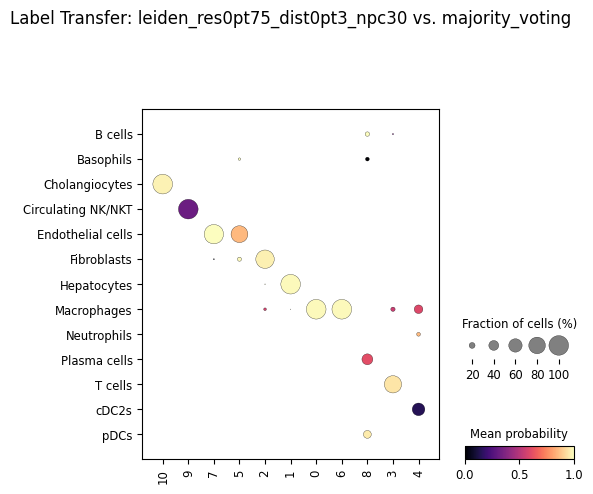

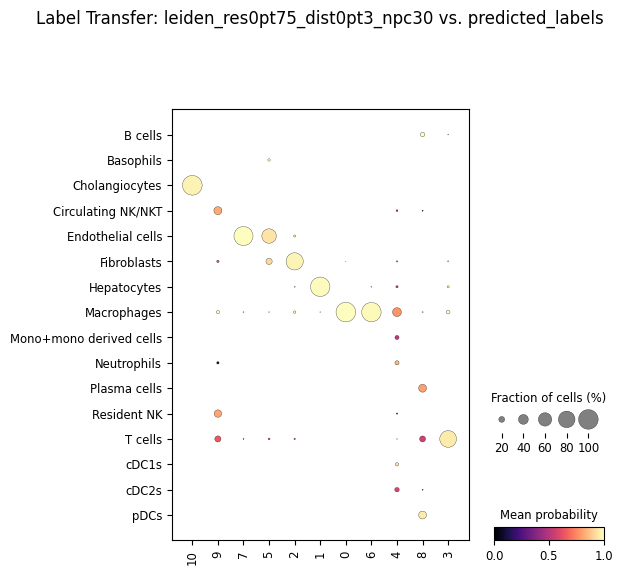

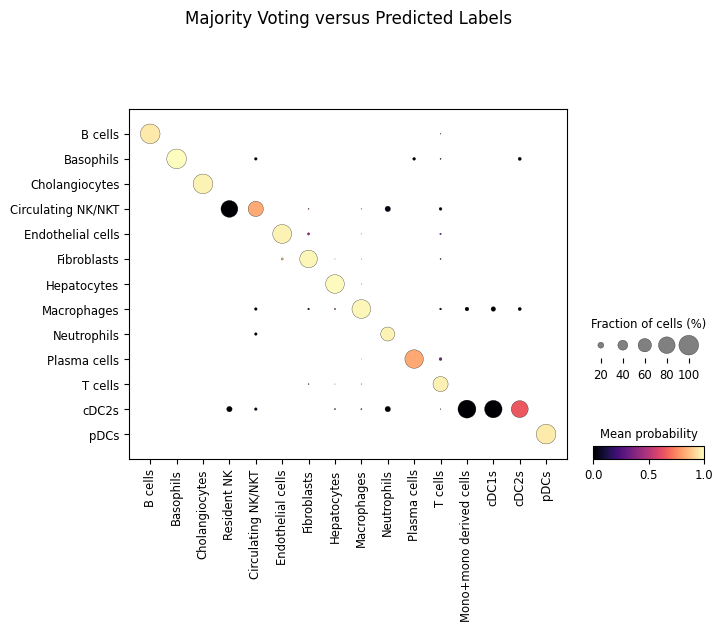




Confidence Scores

 conf_score          count  mean   std   min   25%   50%   75%  max
majority_voting                                                   
B cells               8.0  0.89  0.21  0.44  0.92  1.00  1.00  1.0
Basophils             9.0  0.72  0.37  0.03  0.57  0.99  1.00  1.0
Cholangiocytes       20.0  0.97  0.11  0.51  1.00  1.00  1.00  1.0
Circulating NK/NKT   33.0  0.74  0.33  0.02  0.68  0.94  1.00  1.0
Endothelial cells   104.0  0.96  0.17  0.01  1.00  1.00  1.00  1.0
Fibroblasts          99.0  0.98  0.10  0.37  1.00  1.00  1.00  1.0
Hepatocytes         161.0  0.99  0.07  0.11  1.00  1.00  1.00  1.0
Macrophages         330.0  0.97  0.15  0.00  1.00  1.00  1.00  1.0
Neutrophils           8.0  0.86  0.32  0.07  0.94  0.98  0.99  1.0
Plasma cells         20.0  0.74  0.31  0.11  0.48  0.90  1.00  1.0
T cells              70.0  0.97  0.11  0.14  0.99  1.00  1.00  1.0
cDC2s                40.0  0.63  0.37  0.01  0.33  0.71  0.99  1.0
pDCs                 13.0  0.96  0.09  

(AnnData object with n_obs × n_vars = 915 × 18082
     obs: 'log1p_total_counts_mt', 'log_counts', 'n_counts', 'n_genes', 'n_obs_raw', 'total_counts_mt', 'n_genes_by_counts', 'pct_counts_mt', 'total_counts', 'log1p_total_counts', 'log1p_n_genes_by_counts', 'outlier_n_genes_by_counts_threshold', 'outlier_pct_counts_mt_threshold', 'outlier_total_counts_threshold', 'outlier_log1p_total_counts_threshold', 'outlier_log1p_n_genes_by_counts_threshold', 'outlier', 'assay_protein', 'col_gene_symbols', 'col_cell_type', 'col_sample_id', 'col_batch', 'col_subject', 'col_condition', 'col_num_umis', 'regress_out', 'outlier_mads', 'kws_scale', 'leiden_res0pt75_dist0pt3_npc30', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score'
     var: 'feature_types', 'gene_ids', 'hb', 'log1p_mean_counts', 'mean_counts', 'mt', 'n_cells_by_counts', 'pct_dropout_by_counts', 'ribo', 'total_counts', 'log1p_total_counts', 'outlier_total_counts_threshold', 'outlier_log1p_total_counts_threshold', 'outl

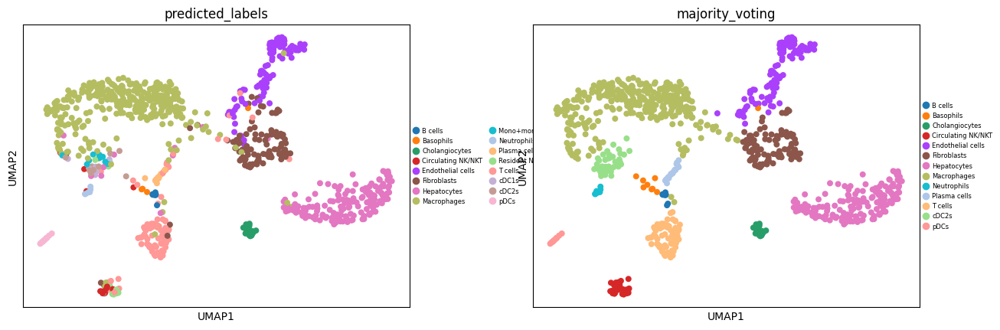

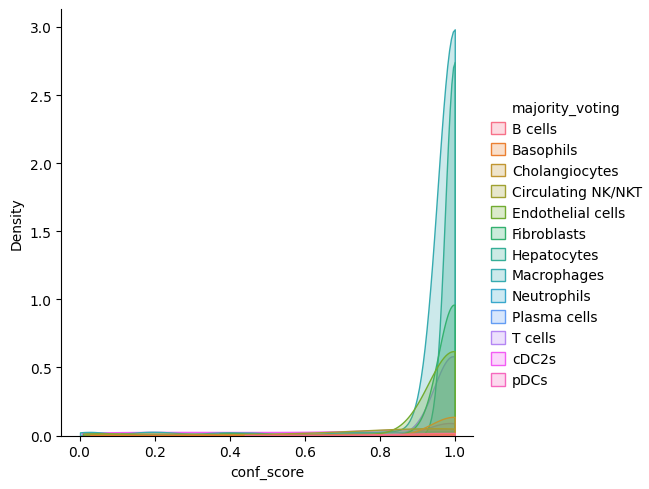

In [61]:
self.annotate_clusters("Healthy_Human_Liver.pkl", col_cell_type=col_leiden)

## Manual

You could also do manual annotation with the same function.

First, define a mapping from Leiden clusters to labels:

```python
cluster_map = pd.Series({"0": "Myeloid", "1": "B Cell", "2": "Epithelial"})
```
(Of course, you'll probably have more clusters than that in real life.)

Then you can annotate based on that mapping:
```python
self.annotate_clusters(cluster_map,
                       col_annotation=f"annotation_manual_{col_leiden}")
```

# Change Default Cell Type?

This process allows you not to have to manually specify the `col_cell_type` arguments in downstream methods.

You also could have done this part originally above where you loaded the object with `cr.Spatial()` (e.g., `cr.Spatial(os.path.join(dir_data, file_path), col_cell_type="lump_res1pt5_dist0_npc30", library_id=lib)`).

You can always change it later just like in the cell below if you want to change the default going forward.

If you want to change it just for one method/function call, just specify the `col_cell_type` argument (e.g., if `self._columns["col_cell_type"]` is "lump_res1pt5_dist0_npc30" and you want to plot the Leiden clusters, run `self.plot_spatial(col_cell_type="leiden_res1pt5_dist0_npc30")` instead of just `self.plot_spatial()`).

Currently, it's set to the Leiden clusters. Change it to the CellTypist annotations?


In [62]:
self._columns["col_cell_type"] = "majority_voting"
# self._columns["col_cell_type"] = "predicted_labels"
# self._columns[
#     "col_cell_type"] = f"annotation_manual_{col_leiden}"  # for manual label

# Plots

Create a variety of plots visualizing gene expression, cell clusters, etc.

For `marker_genes_dict`, you may want to create a dictionary specifying cell type markers rather than auto-extracting them from the DEGs/`find_markers` output (as is done below). For instance:
```python
marker_genes_dict = {"Mast": ["KIT", "CPA3", "KRT1"],
                     "Myofibroblast": ["HHIP", "NPNT", "SYT1", "PITX1"],
                     "SMC": ["MYLK", "DES", "MYH11"],
                     "Neural": ["S100B", "APOE", "COL1A1"]}
```

If you want to focus on a cell type categorization column other than 

You can often specify splitting/color-coding columns to be different across different plots by specifying a different `col_cell_type` argument in their respective `kws_<PLOT>` arguments (e.g., `kws_umap="predicted_labels"`).

By specifying `color` in `kws_umap`, you can create an additional UMAP colored by a column other than the cell type. If you also specified `cell_types_circle` in the main list of arguments, the UMAP will be colored by `kws_umap["color"]` (or the cell type column, if color isn't specified), and the cell types listed in `cell_types_circle` will be circled on it. 

## Define Genes of Interest

In [94]:
genes = ["FTL", "LYZ", "ETS1", "CD74", "IGFBP1", "IGFBP7"]

## Top 3 Marker Genes


<<< PLOTTING GEX (Heatmap) >>>


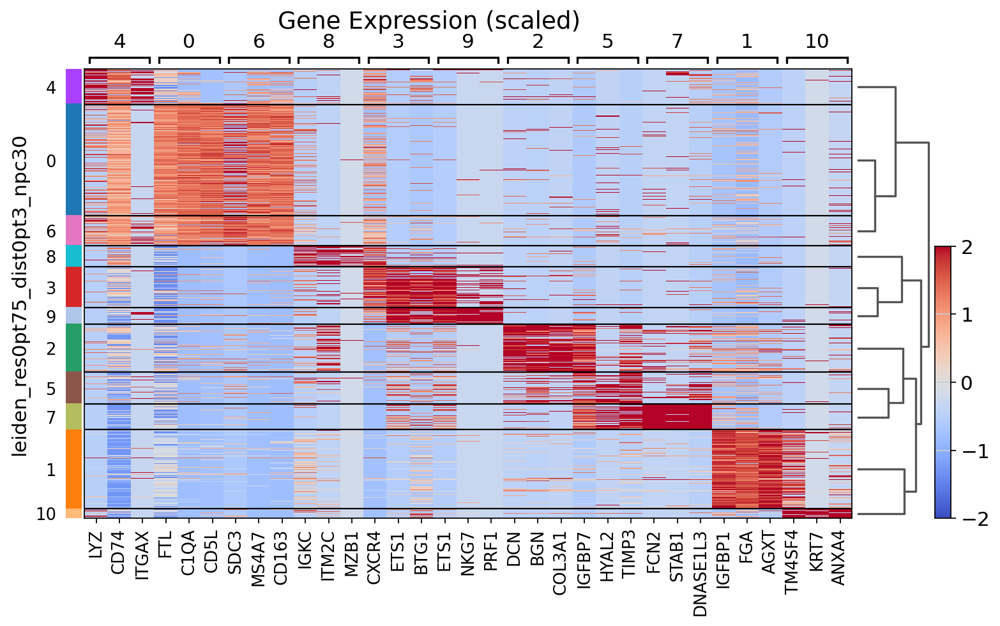

In [82]:
marker_genes_dict = dict(marks.groupby(col_leiden).apply(
    lambda x: list(x.reset_index()["names"][:min(x.shape[0], 3)])))

figs = self.plot(marker_genes_dict=marker_genes_dict, group=col_leiden,
                 layer="scaled", kind="heat", kws_heat=dict(vmin=-2, vmax=2))

## Various Plots


<<< PLOTTING GEX (Heatmap) >>>


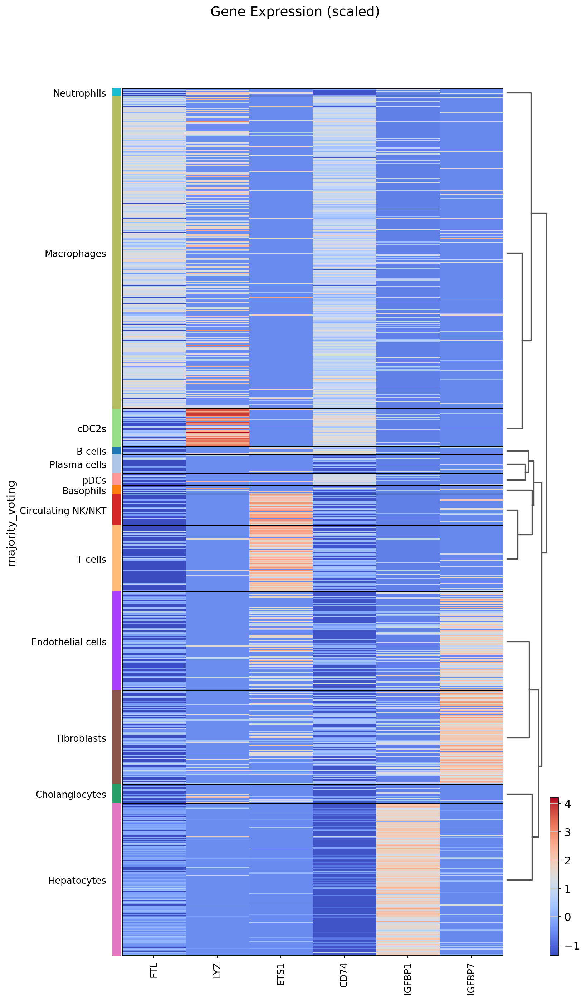

In [96]:
figs = self.plot(genes=genes, figsize=(10, 20), kind="heat", layer="scaled")


<<< PLOTTING GEX (Dot) >>>


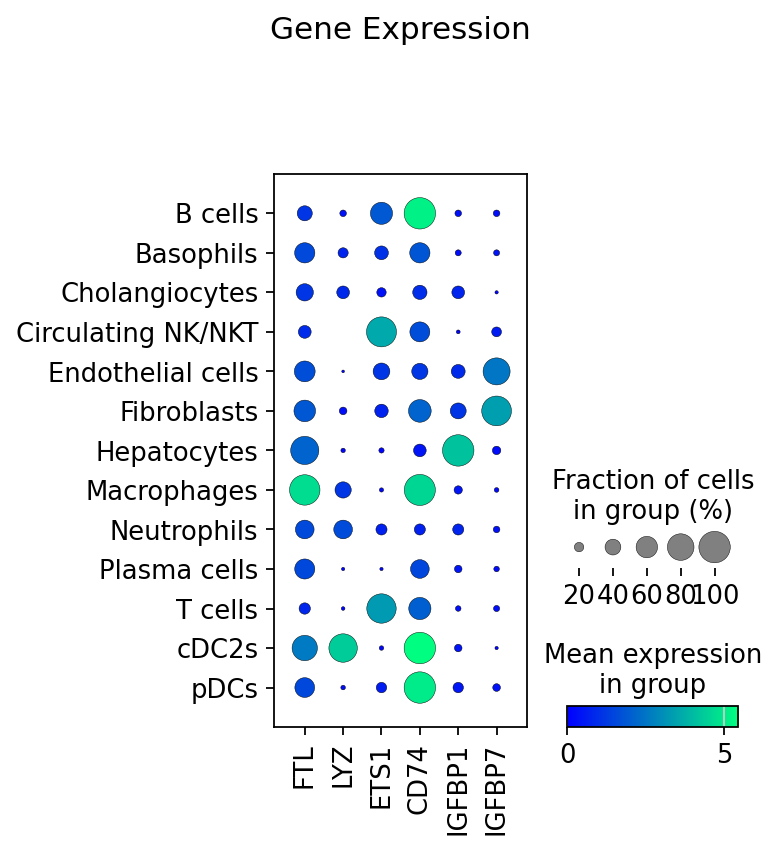

In [97]:
figs = self.plot(genes=genes, kind="dot")


<<< PLOTTING GEX (Heatmap) >>>

<<< PLOTTING GEX (Violin) >>>


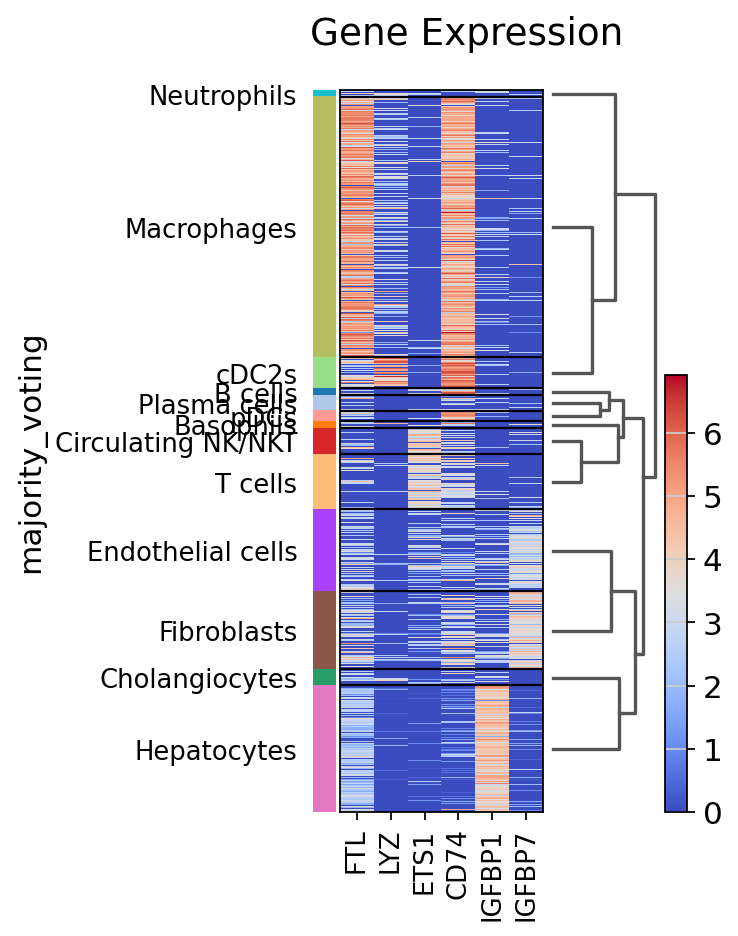

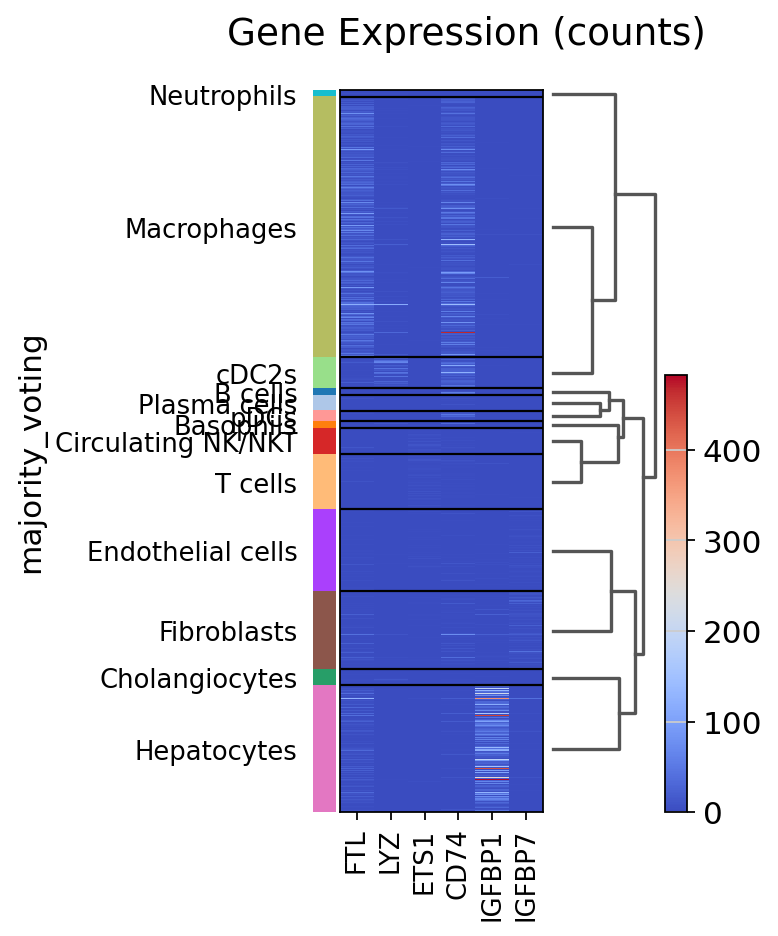

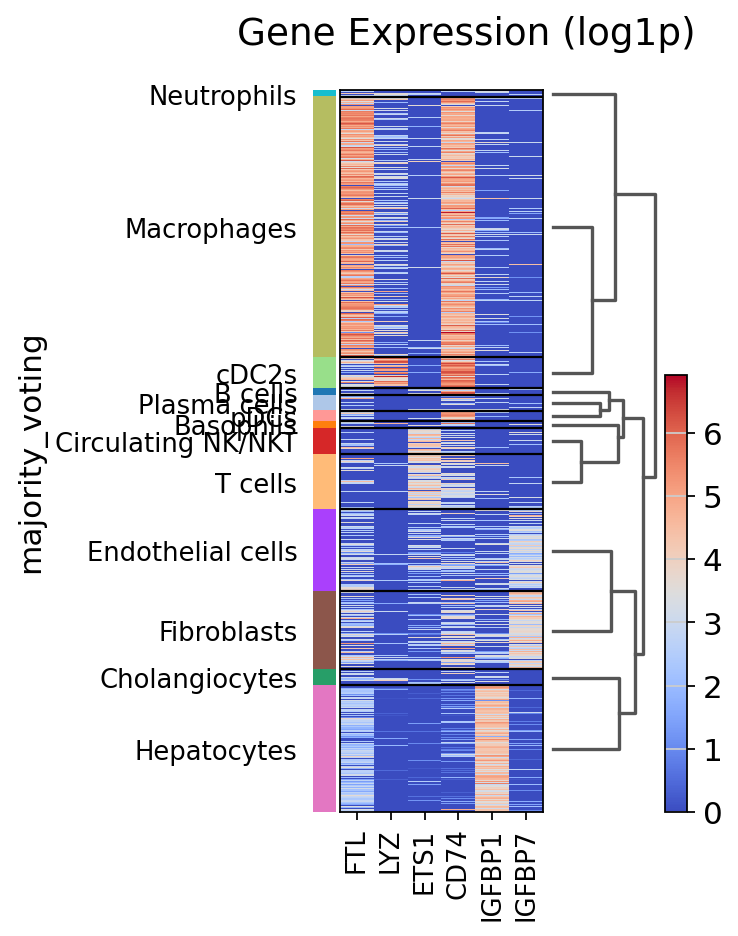

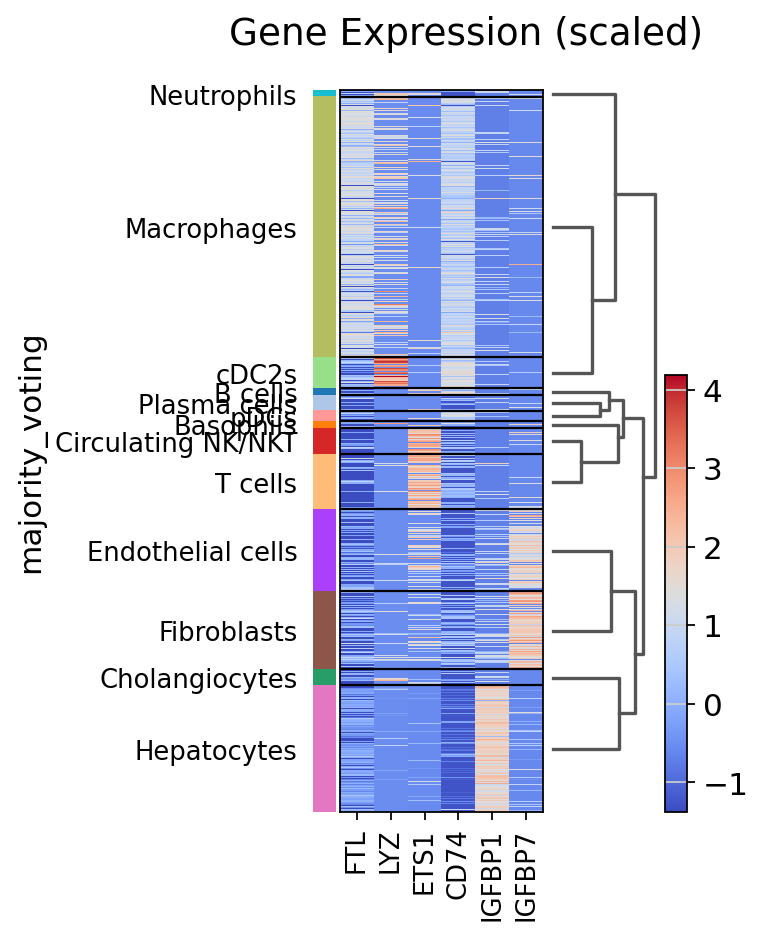

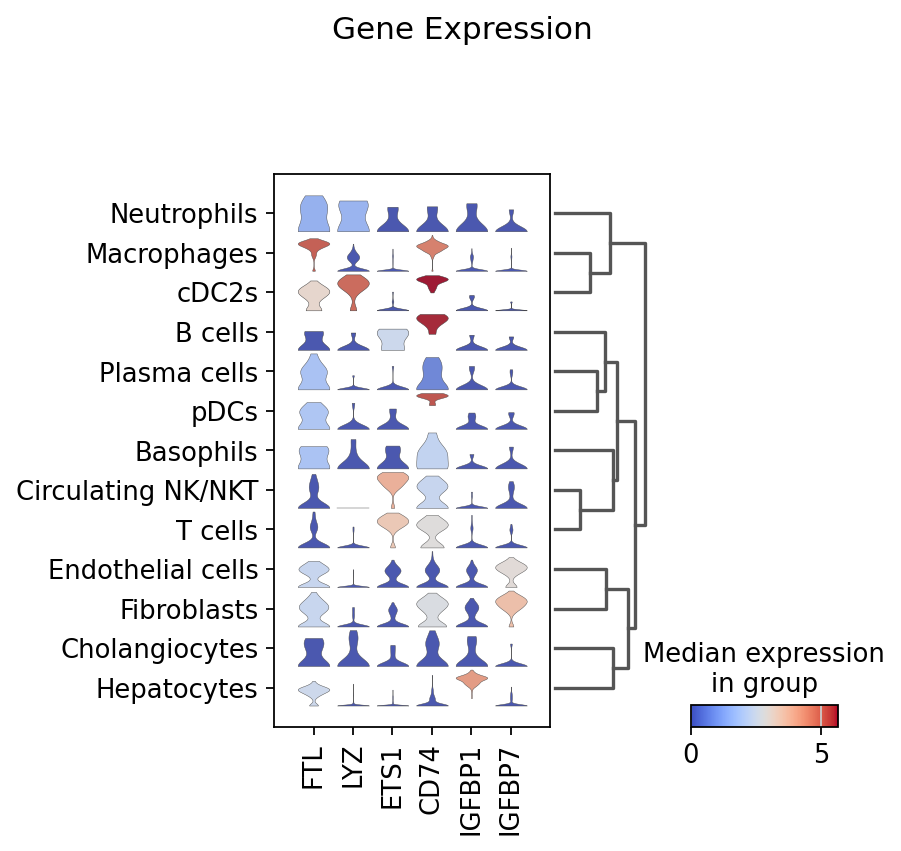

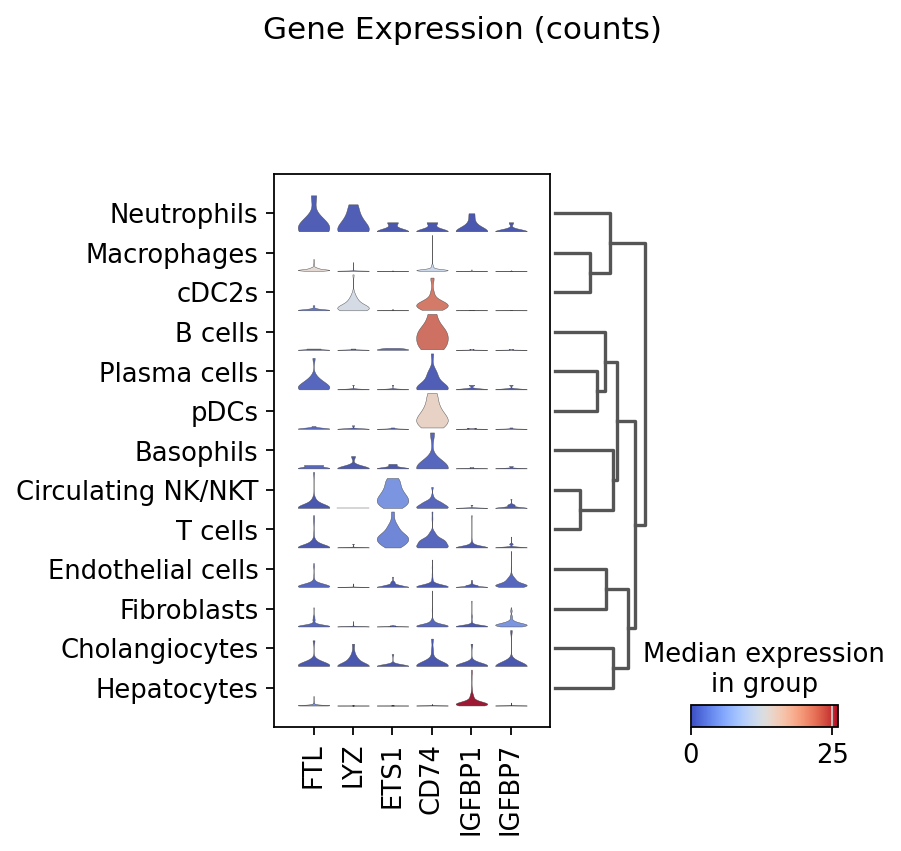

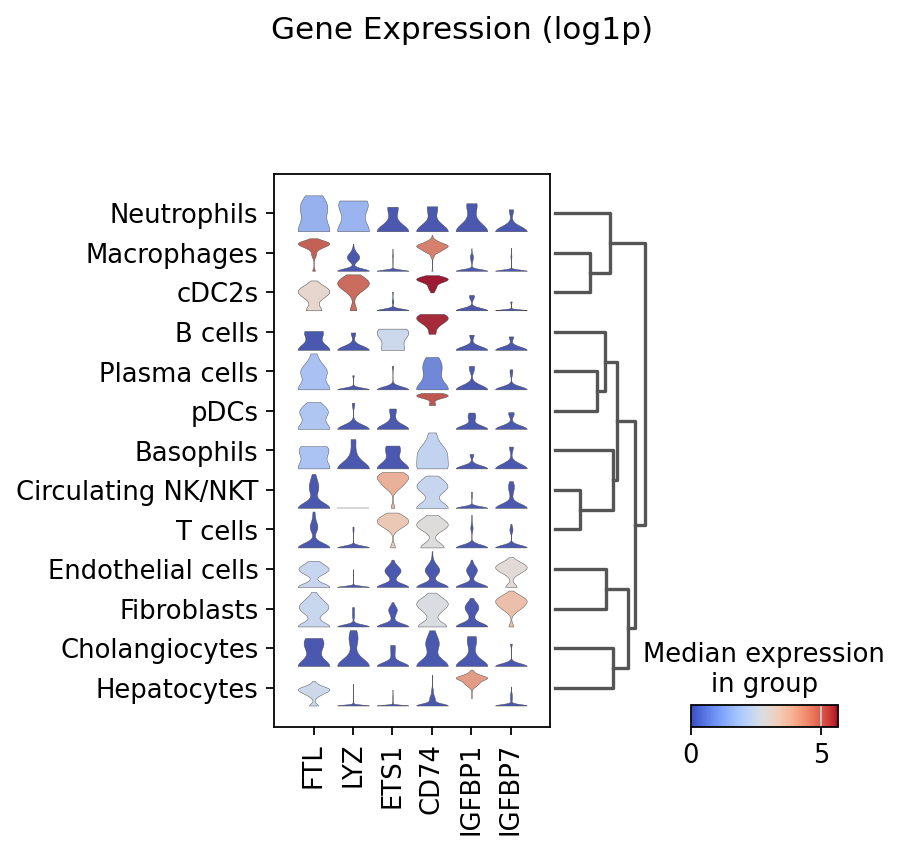

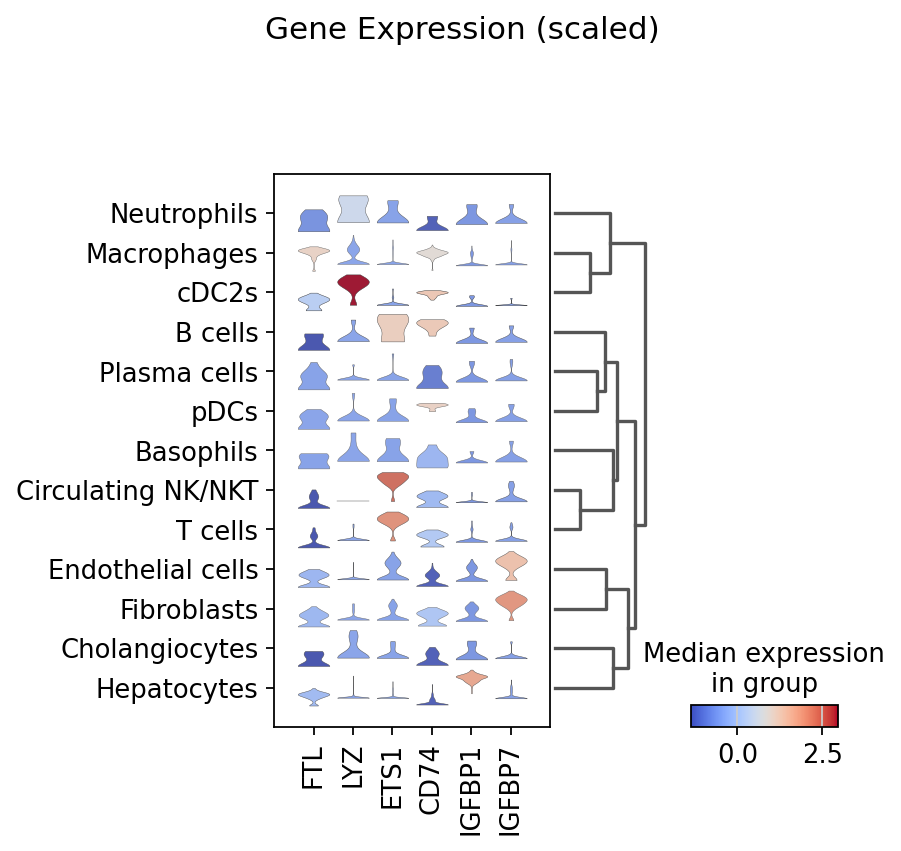


<<< PLOTTING GEX (Dot) >>>


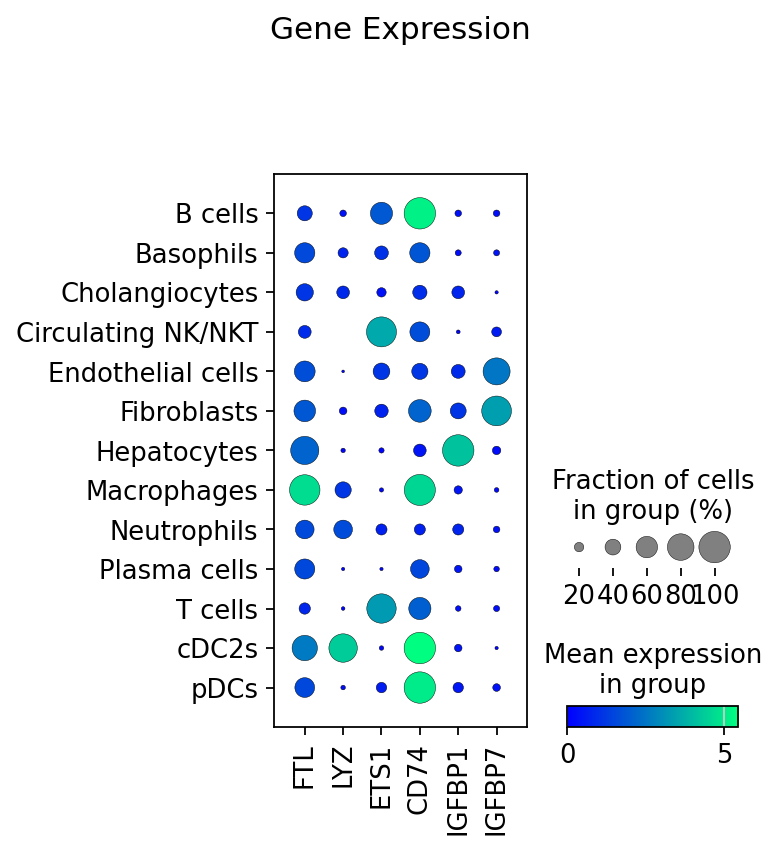


<<< PLOTTING UMAP >>>

<<< PLOTTING GEX ON UMAP >>>


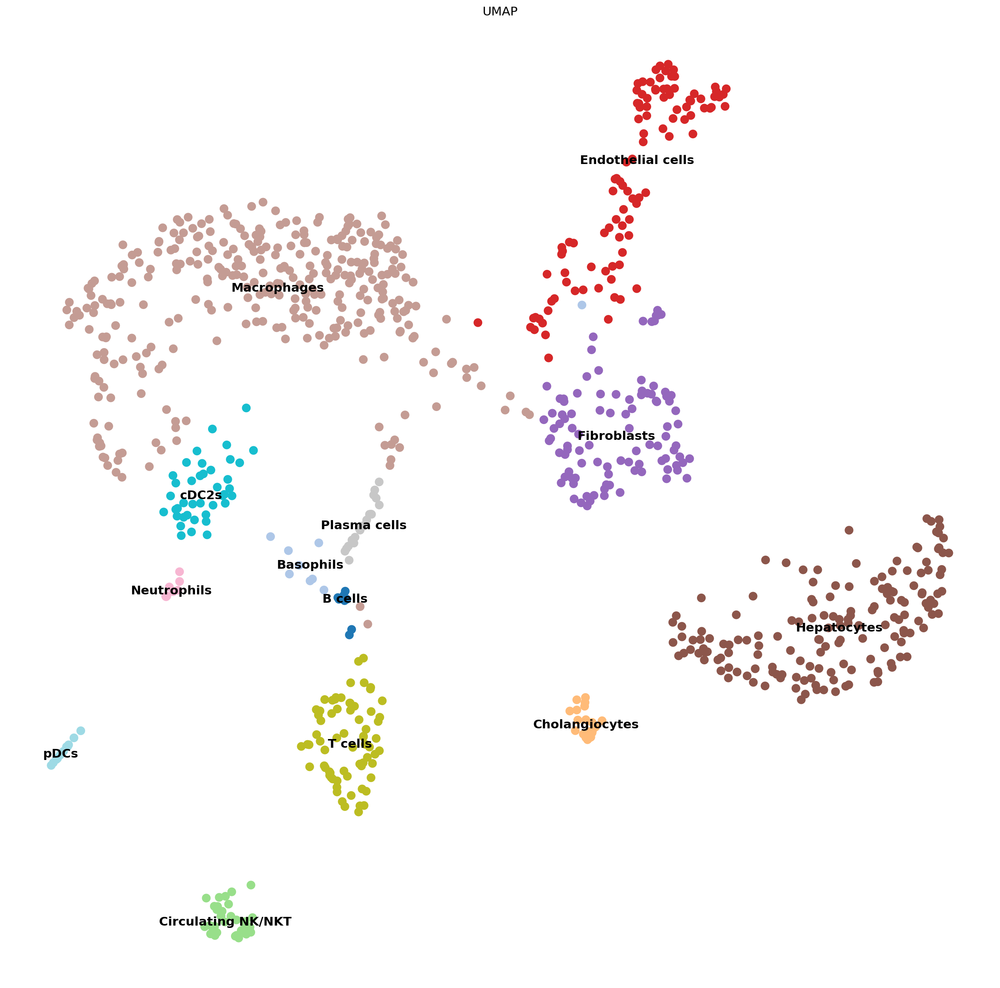

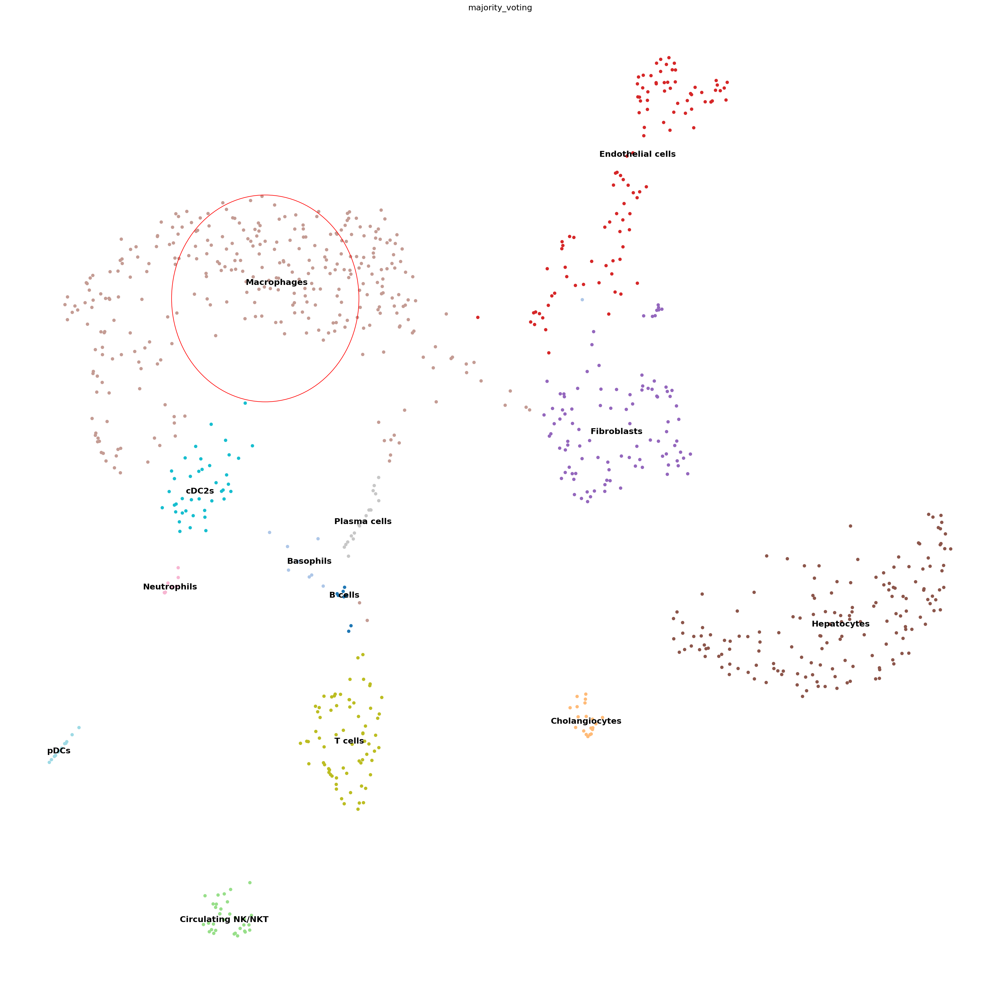

In [98]:
figs = self.plot(genes=genes,
                 cell_types_circle="Macrophages",  # to circle on UMAP
                 kws_gex_violin=dict(scale="area", height=15))

## GEX & Cell Type Composition

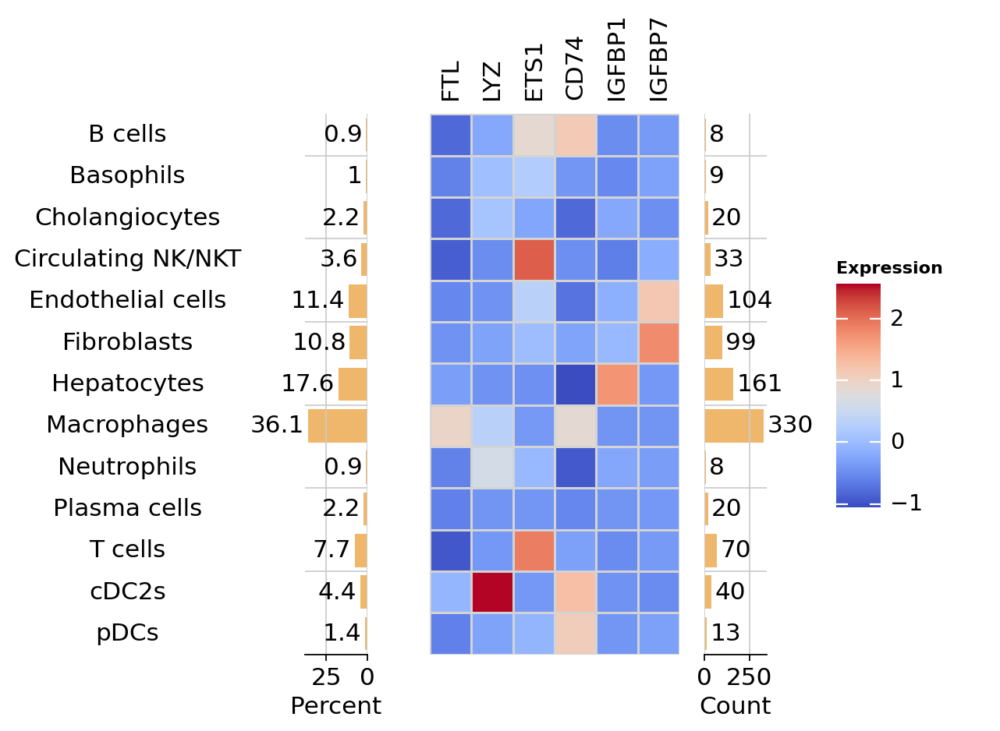

In [99]:
cr.pl.plot_matrix(self.rna, "majority_voting", genes, layer="scaled")

# Analysis

## Quantify Gene+ Cell Percentage

In [110]:
self.quantify_cells(genes, threshold=0)

N_Cells_Positive  N_Cluster    Percent  N_Sample  \
Gene   majority_voting                                                        
FTL    B cells                            3          8  37.500000       915   
       Basophils                          5          9  55.555556       915   
       Cholangiocytes                     9         20  45.000000       915   
       Circulating NK/NKT                10         33  30.303030       915   
       Endothelial cells                 60        104  57.692308       915   
...                                     ...        ...        ...       ...   
IGFBP7 Neutrophils                        1          8  12.500000       915   
       Plasma cells                       2         20  10.000000       915   
       T cells                            8         70  11.428571       915   
       cDC2s                              2         40   5.000000       915   
       pDCs                               2         13  15.384615       915   

                           threshold  
Gene   majority_voting                
FTL    B cells                     0  
       Basophils                   0  
       Cholangiocytes              0  
       Circulating NK/NKT          0  
       Endothelial cells           0  
...                              ...  
IGFBP7 Neutrophils                 0  
       Plasma cells                0  
       T cells                     0  
       cDC2s                       0  
       pDCs                        0  

[78 rows x 5 columns]

In [141]:
self.quantify_cells(genes, threshold=1)

N_Cells_Positive  N_Cluster    Percent  N_Sample  \
Gene   majority_voting                                                        
FTL    B cells                            2          8  25.000000       915   
       Basophils                          3          9  33.333333       915   
       Cholangiocytes                     5         20  25.000000       915   
       Circulating NK/NKT                 4         33  12.121212       915   
       Endothelial cells                 30        104  28.846154       915   
...                                     ...        ...        ...       ...   
IGFBP7 Neutrophils                        0          8   0.000000       915   
       Plasma cells                       0         20   0.000000       915   
       T cells                            1         70   1.428571       915   
       cDC2s                              0         40   0.000000       915   
       pDCs                               1         13   7.692308       915   

                           threshold  
Gene   majority_voting                
FTL    B cells                     1  
       Basophils                   1  
       Cholangiocytes              1  
       Circulating NK/NKT          1  
       Endothelial cells           1  
...                              ...  
IGFBP7 Neutrophils                 1  
       Plasma cells                1  
       T cells                     1  
       cDC2s                       1  
       pDCs                        1  

[78 rows x 5 columns]

## Coexpression

N_Cells_Positive  N_Cluster    Percent  \
Gene           majority_voting                                              
LYZ/CD74       B cells                            1          8  12.500000   
               Basophils                          1          9  11.111111   
               Cholangiocytes                     4         20  20.000000   
               Circulating NK/NKT                 0         33   0.000000   
               Endothelial cells                  4        104   3.846154   
               Fibroblasts                       13         99  13.131313   
               Hepatocytes                        9        161   5.590062   
               Macrophages                      137        330  41.515152   
               Neutrophils                        0          8   0.000000   
               Plasma cells                       0         20   0.000000   
               T cells                            3         70   4.285714   
               cDC2s                             35         40  87.500000   
               pDCs                               1         13   7.692308   
ETS1/NKG7/PRF1 B cells                            0          8   0.000000   
               Basophils                          3          9  33.333333   
               Cholangiocytes                     0         20   0.000000   
               Circulating NK/NKT                27         33  81.818182   
               Endothelial cells                  0        104   0.000000   
               Fibroblasts                        0         99   0.000000   
               Hepatocytes                        0        161   0.000000   
               Macrophages                        2        330   0.606061   
               Neutrophils                        0          8   0.000000   
               Plasma cells                       0         20   0.000000   
               T cells                           15         70  21.428571   
               cDC2s                              1         40   2.500000   
               pDCs                               0         13   0.000000   

                                   N_Sample  min_genes  threshold  
Gene           majority_voting                                     
LYZ/CD74       B cells                  915          2          0  
               Basophils                915          2          0  
               Cholangiocytes           915          2          0  
               Circulating NK/NKT       915          2          0  
               Endothelial cells        915          2          0  
               Fibroblasts              915          2          0  
               Hepatocytes              915          2          0  
               Macrophages              915          2          0  
               Neutrophils              915          2          0  
               Plasma cells             915          2          0  
               T cells                  915          2          0  
               cDC2s                    915          2          0  
               pDCs                     915          2          0  
ETS1/NKG7/PRF1 B cells                  915          3          0  
               Basophils                915          3          0  
               Cholangiocytes           915          3          0  
               Circulating NK/NKT       915          3          0  
               Endothelial cells        915          3          0  
               Fibroblasts              915          3          0  
               Hepatocytes              915          3          0  
               Macrophages              915          3          0  
               Neutrophils              915          3          0  
               Plasma cells             915          3          0  
               T cells                  915          3          0  
               cDC2s                    915          3          0  
               pDCs                     91

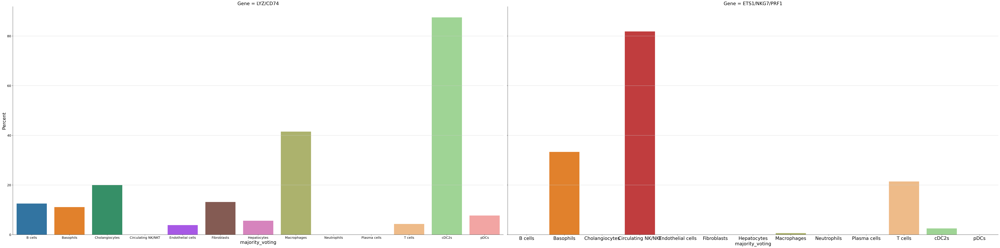

In [140]:
self.quantify_cells([["LYZ", "CD74"], ["ETS1", "NKG7", "PRF1"]])

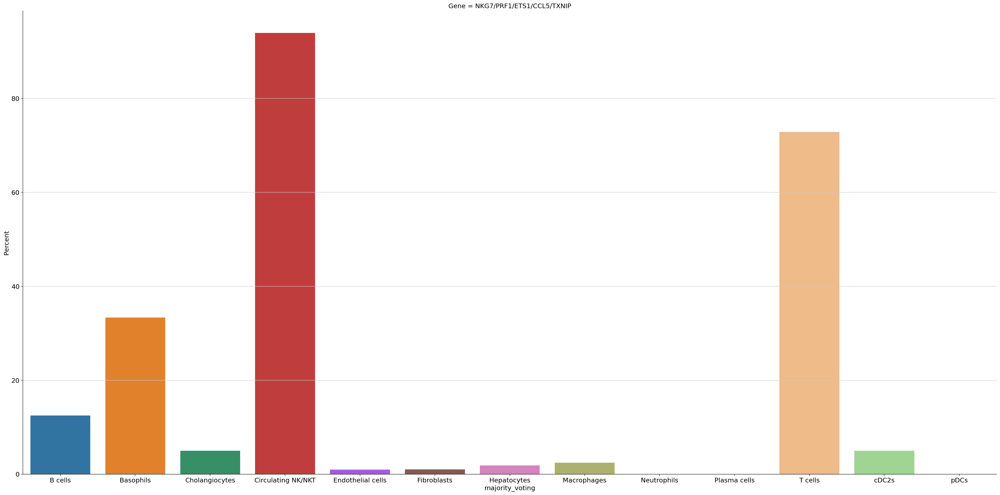

In [134]:
out = self.quantify_cells([["NKG7", "PRF1", "ETS1", "CCL5", "TXNIP"]],
                          min_genes=3)